# Building Segmentantation Experiments

## Requirements

In [1]:
%%writefile requirements.txt
torch
torchvision
matplotlib
numpy
pandas
tqdm
opencv-python
albumentations
segmentation_models_pytorch
tensorboard

Writing requirements.txt


In [2]:
!pip install -r requirements.txt

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 460.5 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 33.2 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=17f3f7b49cc222f8ce3df6cc8610dade1f8dc00378d667a8c5f5c2653aa4527f
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=d871fbd2ca736ddae311ad5c293a35a68babaa2ec5392491570b52cc7cff3b33
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytor

## Scripts

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import sys
sys.path.append('/content/drive/MyDrive/thesis_code/segmentation')

Mounted at /content/drive


In [4]:
import os
import pandas as pd
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scripts.loader import get_dataloaders
from scripts.utils import visualize_train_samples, visualize_test_predictions
from scripts.models import UNet
from scripts.loss import HybridLoss
from scripts.train import train_model
from scripts.evaluation import evaluate_model, update_experiment_results_csv
from scripts.instance_segm import process_predictions_to_instance_masks, visualize_instance_results, evaluate_instance_masks

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


## Data Retrieval

In [5]:
!cp "/content/drive/MyDrive/thesis_code/segmentation/data/massachusetts.zip" "/content/massachusetts.zip"
!cp -r "/content/drive/MyDrive/thesis_code/segmentation/models" "/content/models"
!mkdir "/content/data"
!unzip "/content/massachusetts.zip" -d "/content/data"

Archive:  /content/massachusetts.zip
  inflating: /content/data/label_class_dict.csv  
  inflating: /content/data/metadata.csv  
  inflating: /content/data/png/test/22828930_15.png  
  inflating: /content/data/png/test/22828990_15.png  
  inflating: /content/data/png/test/22829050_15.png  
  inflating: /content/data/png/test/23429020_15.png  
  inflating: /content/data/png/test/23429080_15.png  
  inflating: /content/data/png/test/23578960_15.png  
  inflating: /content/data/png/test/23579005_15.png  
  inflating: /content/data/png/test/23729035_15.png  
  inflating: /content/data/png/test/23879080_15.png  
  inflating: /content/data/png/test/24179065_15.png  
  inflating: /content/data/png/test_labels/22828930_15.png  
  inflating: /content/data/png/test_labels/22828990_15.png  
  inflating: /content/data/png/test_labels/22829050_15.png  
  inflating: /content/data/png/test_labels/23429020_15.png  
  inflating: /content/data/png/test_labels/23429080_15.png  
  inflating: /content/data

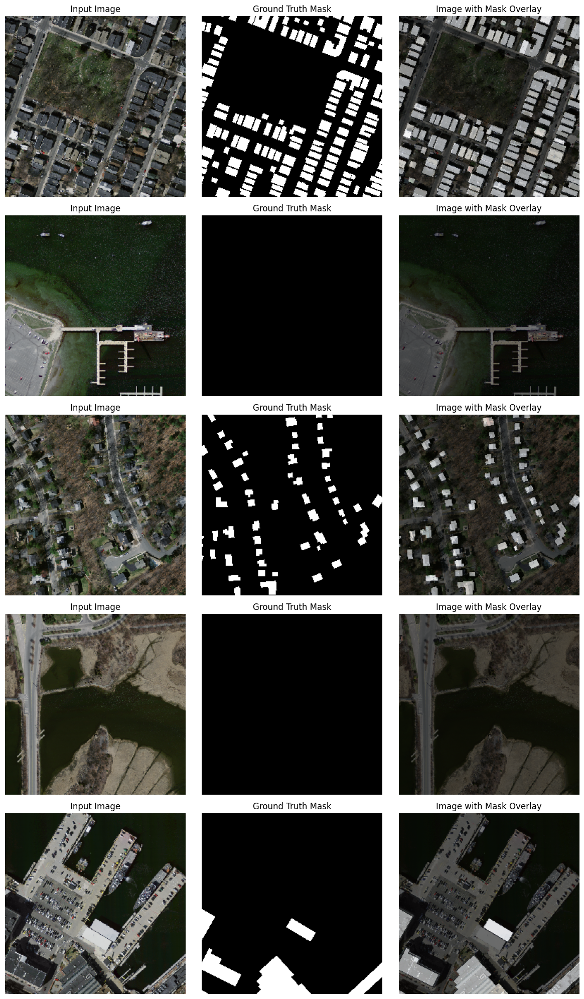

In [9]:
DATA_DIR = '/content/data/tiff/'
x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_labels')
x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_labels')
x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_labels')

class_dict = pd.read_csv("./data/label_class_dict.csv")
class_rgb_values = class_dict[['r', 'g', 'b']].values.tolist()

# Get dataloaders
train_loader, valid_loader, test_loader = get_dataloaders(
    x_train_dir, y_train_dir, x_valid_dir, y_valid_dir, x_test_dir, y_test_dir, class_rgb_values
)

# Visualize samples
visualize_train_samples(train_loader, class_rgb_values)

## Experiments

### UNet - standard augmentations

#### Training

In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_Unet = UNet().to(DEVICE)
loss_fn = HybridLoss()
optimizer = torch.optim.Adam([dict(params=model_Unet.parameters(), lr=1e-4)])
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=1, T_mult=2, eta_min=5e-5)

train_logs, valid_logs = train_model(model_Unet, train_loader, valid_loader, loss_fn, optimizer, lr_scheduler, epochs=20, device=DEVICE, exp_num=0)

Epoch 1/20


100%|██████████| 4/4 [00:16<00:00,  4.09s/it]


Epoch 1:
  Train Loss: 0.3889, Precision: 0.7296, Recall: 0.7288, F1: 0.7254, IoU: 0.5695
  Val Loss: 0.3561, Precision: 0.7588, Recall: 0.7217, F1: 0.7339, IoU: 0.5800
Epoch 2/20


100%|██████████| 4/4 [00:16<00:00,  4.19s/it]


Epoch 2:
  Train Loss: 0.4361, Precision: 0.7086, Recall: 0.6713, F1: 0.6841, IoU: 0.5214
  Val Loss: 0.3555, Precision: 0.6894, Recall: 0.7929, F1: 0.7348, IoU: 0.5809
Epoch 3/20


100%|██████████| 4/4 [00:15<00:00,  3.97s/it]


Epoch 3:
  Train Loss: 0.4363, Precision: 0.7028, Recall: 0.6847, F1: 0.6871, IoU: 0.5255
  Val Loss: 0.3580, Precision: 0.7465, Recall: 0.7265, F1: 0.7306, IoU: 0.5762
Epoch 4/20


100%|██████████| 4/4 [00:15<00:00,  3.99s/it]


Epoch 4:
  Train Loss: 0.4114, Precision: 0.7287, Recall: 0.6914, F1: 0.7079, IoU: 0.5500
  Val Loss: 0.3880, Precision: 0.7545, Recall: 0.6816, F1: 0.6996, IoU: 0.5420
Epoch 5/20


100%|██████████| 4/4 [00:16<00:00,  4.12s/it]


Epoch 5:
  Train Loss: 0.4437, Precision: 0.7010, Recall: 0.6590, F1: 0.6742, IoU: 0.5094
  Val Loss: 0.3493, Precision: 0.7509, Recall: 0.7403, F1: 0.7395, IoU: 0.5869
Epoch 6/20


100%|██████████| 4/4 [00:17<00:00,  4.35s/it]


Epoch 6:
  Train Loss: 0.4079, Precision: 0.7302, Recall: 0.7095, F1: 0.7147, IoU: 0.5573
  Val Loss: 0.3456, Precision: 0.7324, Recall: 0.7625, F1: 0.7434, IoU: 0.5917
Epoch 7/20


100%|██████████| 4/4 [00:17<00:00,  4.33s/it]


Epoch 7:
  Train Loss: 0.4109, Precision: 0.7056, Recall: 0.6873, F1: 0.6921, IoU: 0.5347
  Val Loss: 0.3467, Precision: 0.7395, Recall: 0.7578, F1: 0.7445, IoU: 0.5931
Epoch 8/20


100%|██████████| 4/4 [00:18<00:00,  4.55s/it]


Epoch 8:
  Train Loss: 0.3923, Precision: 0.7376, Recall: 0.6987, F1: 0.7142, IoU: 0.5566
  Val Loss: 0.3472, Precision: 0.7581, Recall: 0.7339, F1: 0.7410, IoU: 0.5889
Epoch 9/20


100%|██████████| 4/4 [00:18<00:00,  4.51s/it]


Epoch 9:
  Train Loss: 0.3981, Precision: 0.7515, Recall: 0.6951, F1: 0.7197, IoU: 0.5640
  Val Loss: 0.3532, Precision: 0.7542, Recall: 0.7295, F1: 0.7346, IoU: 0.5811
Epoch 10/20


100%|██████████| 4/4 [00:17<00:00,  4.41s/it]


Epoch 10:
  Train Loss: 0.3912, Precision: 0.7255, Recall: 0.7257, F1: 0.7243, IoU: 0.5707
  Val Loss: 0.3450, Precision: 0.7331, Recall: 0.7708, F1: 0.7468, IoU: 0.5961
Epoch 11/20


100%|██████████| 4/4 [00:17<00:00,  4.39s/it]


Epoch 11:
  Train Loss: 0.4058, Precision: 0.7467, Recall: 0.6960, F1: 0.7180, IoU: 0.5616
  Val Loss: 0.3648, Precision: 0.7492, Recall: 0.7139, F1: 0.7217, IoU: 0.5660
Epoch 12/20


100%|██████████| 4/4 [00:17<00:00,  4.36s/it]


Epoch 12:
  Train Loss: 0.3847, Precision: 0.7341, Recall: 0.7205, F1: 0.7265, IoU: 0.5718
  Val Loss: 0.3370, Precision: 0.7351, Recall: 0.7712, F1: 0.7490, IoU: 0.5988
Epoch 13/20


100%|██████████| 4/4 [00:17<00:00,  4.34s/it]


Epoch 13:
  Train Loss: 0.3887, Precision: 0.7490, Recall: 0.7223, F1: 0.7347, IoU: 0.5812
  Val Loss: 0.3400, Precision: 0.7173, Recall: 0.7748, F1: 0.7432, IoU: 0.5915
Epoch 14/20


100%|██████████| 4/4 [00:17<00:00,  4.30s/it]


Epoch 14:
  Train Loss: 0.4116, Precision: 0.7366, Recall: 0.7167, F1: 0.7237, IoU: 0.5680
  Val Loss: 0.3331, Precision: 0.7237, Recall: 0.7774, F1: 0.7472, IoU: 0.5968
Epoch 15/20


100%|██████████| 4/4 [00:16<00:00,  4.23s/it]


Epoch 15:
  Train Loss: 0.3841, Precision: 0.7043, Recall: 0.7554, F1: 0.7272, IoU: 0.5719
  Val Loss: 0.3464, Precision: 0.7041, Recall: 0.7994, F1: 0.7466, IoU: 0.5958
Epoch 16/20


100%|██████████| 4/4 [00:16<00:00,  4.24s/it]


Epoch 16:
  Train Loss: 0.4226, Precision: 0.7390, Recall: 0.6780, F1: 0.7055, IoU: 0.5461
  Val Loss: 0.3479, Precision: 0.7574, Recall: 0.7226, F1: 0.7364, IoU: 0.5831
Epoch 17/20


100%|██████████| 4/4 [00:16<00:00,  4.19s/it]


Epoch 17:
  Train Loss: 0.3828, Precision: 0.7188, Recall: 0.7408, F1: 0.7277, IoU: 0.5732
  Val Loss: 0.3446, Precision: 0.7753, Recall: 0.7097, F1: 0.7380, IoU: 0.5852
Epoch 18/20


100%|██████████| 4/4 [00:16<00:00,  4.22s/it]


Epoch 18:
  Train Loss: 0.3967, Precision: 0.7401, Recall: 0.6941, F1: 0.7135, IoU: 0.5559
  Val Loss: 0.3287, Precision: 0.7416, Recall: 0.7717, F1: 0.7531, IoU: 0.6040
Epoch 19/20


100%|██████████| 4/4 [00:17<00:00,  4.27s/it]


Epoch 19:
  Train Loss: 0.4015, Precision: 0.7182, Recall: 0.7273, F1: 0.7168, IoU: 0.5611
  Val Loss: 0.3367, Precision: 0.7318, Recall: 0.7729, F1: 0.7496, IoU: 0.5999
Epoch 20/20


100%|██████████| 4/4 [00:17<00:00,  4.25s/it]

Epoch 20:
  Train Loss: 0.3925, Precision: 0.7437, Recall: 0.6989, F1: 0.7184, IoU: 0.5639
  Val Loss: 0.3404, Precision: 0.7606, Recall: 0.7341, F1: 0.7446, IoU: 0.5934


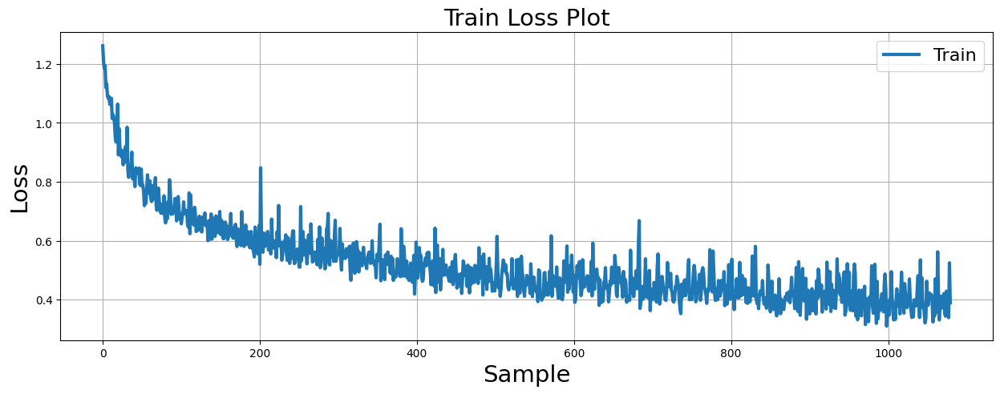

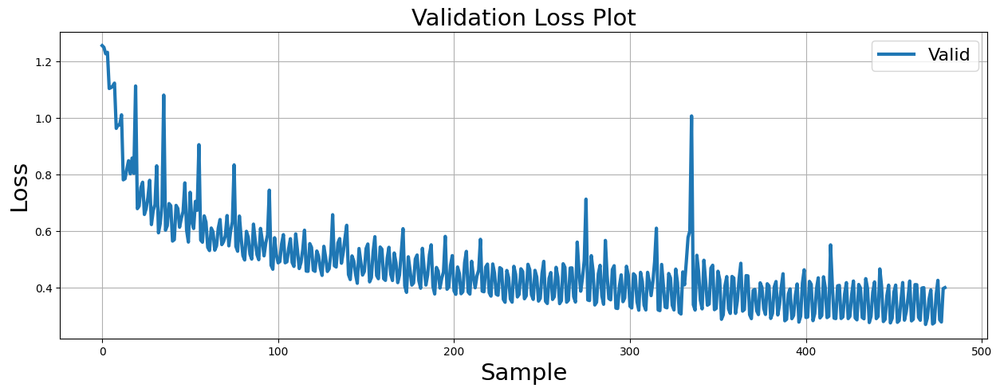

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(train_logs, lw=3, label='Train')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Train Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()
plt.figure(figsize=(15, 5))
plt.plot(valid_logs, lw=3, label='Valid')
plt.xlabel('Sample', fontsize=21)
plt.ylabel('Loss', fontsize=21)
plt.title('Validation Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.show()

In [ ]:
checkpoint = {
    "epoch": 120,
    "model_state": model_Unet.state_dict(),
    "optimizer_state": optimizer.state_dict(),
    "scheduler_state": lr_scheduler.state_dict(),
    }

torch.save(checkpoint, f"model_UNet_checkpoints_120.pt")

#### Evaluation

100%|██████████| 10/10 [00:39<00:00,  3.97s/it]


Test Loss: 0.3849, Precision: 0.7880, Recall: 0.7530, F1: 0.7682, IoU: 0.6252


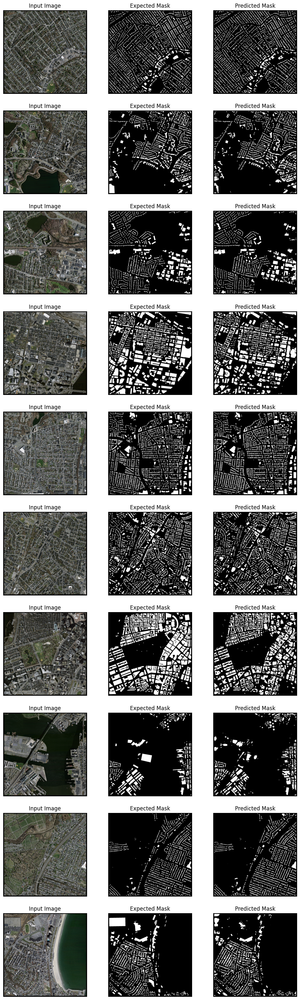

In [11]:
predictions, test_loss, test_metrics = evaluate_model(model_Unet, test_loader, loss_fn, DEVICE, class_rgb_values)
print(f'Test Loss: {test_loss:.4f}, Precision: {test_metrics["precision"]:.4f}, Recall: {test_metrics["recall"]:.4f}, F1: {test_metrics["f1_score"]:.4f}, IoU: {test_metrics["iou"]:.4f}')
visualize_test_predictions(predictions)

In [12]:
csv_path = "/content/drive/MyDrive/thesis_code/segmentation/experiment_results.csv"
model_name = "UNet"
learning_rate = 1e-4
scheduler_name = "CosineAnnealingWarmRestarts"
optimizer_name = "Adam"
num_epochs = 120


# Update CSV
update_experiment_results_csv(
    csv_path, model_name, learning_rate, scheduler_name, optimizer_name,
    num_epochs, test_loss, test_metrics
)

#### Instance Segmentation

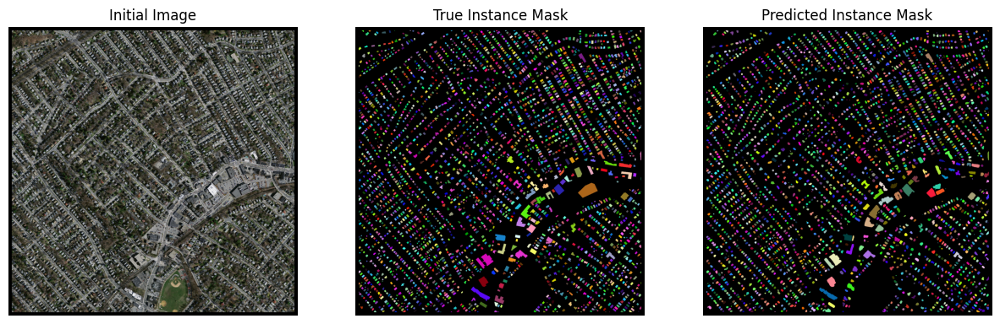

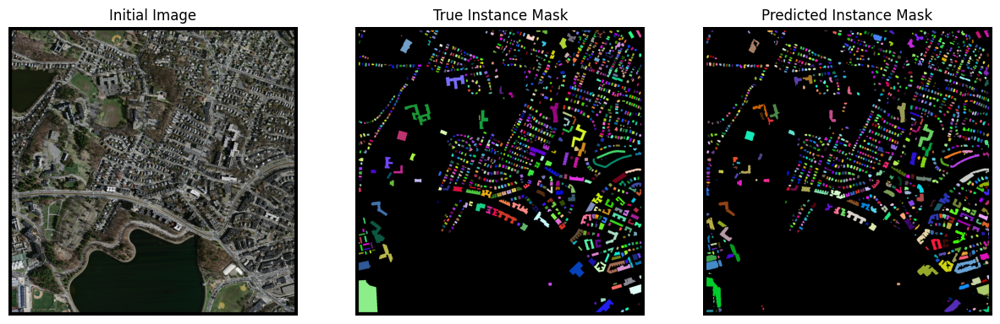

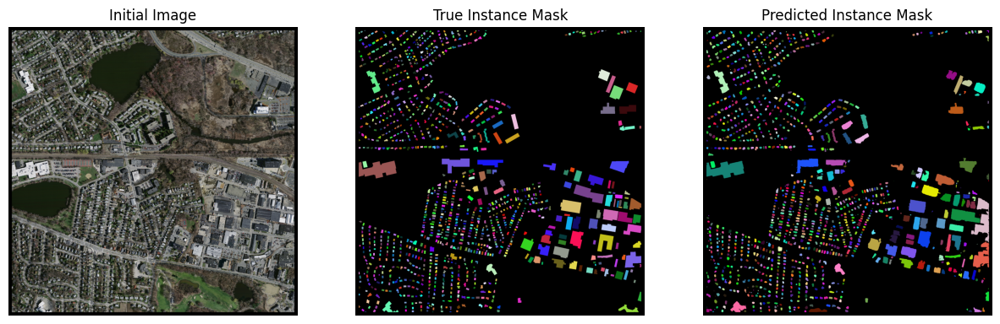

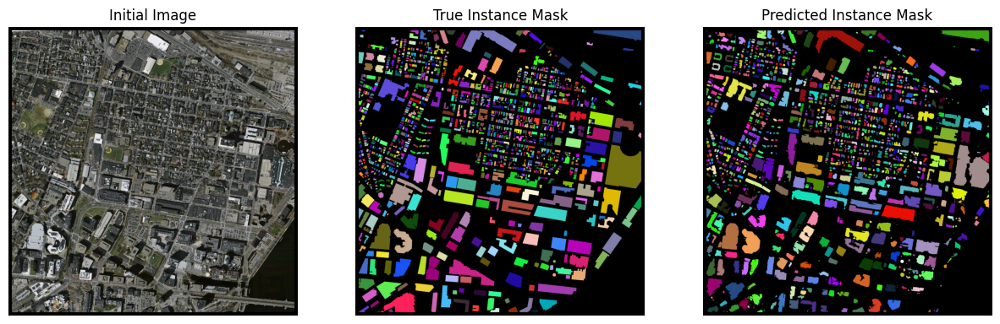

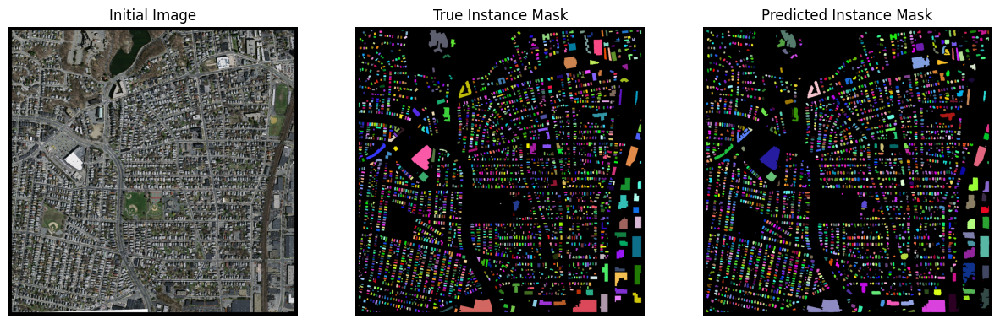

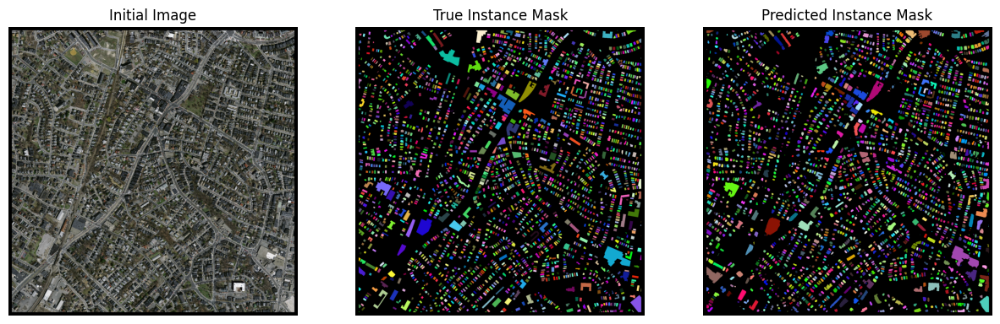

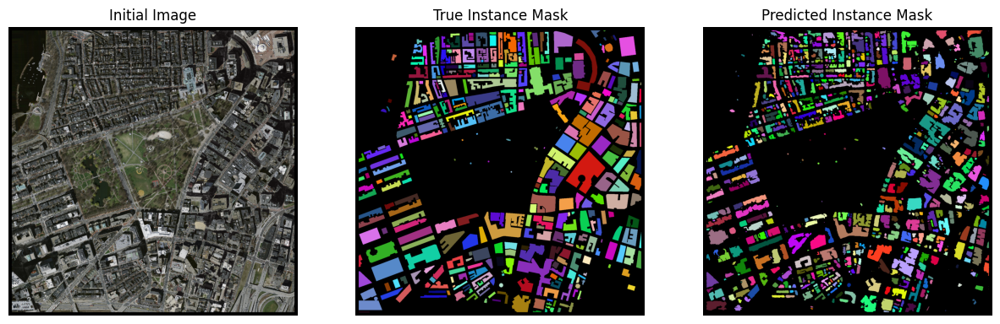

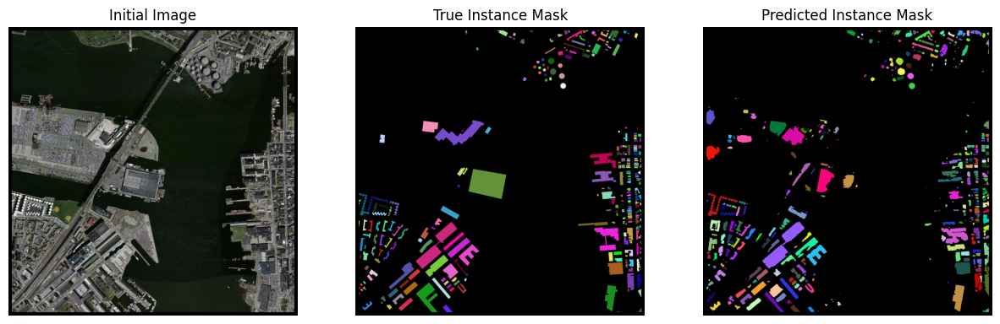

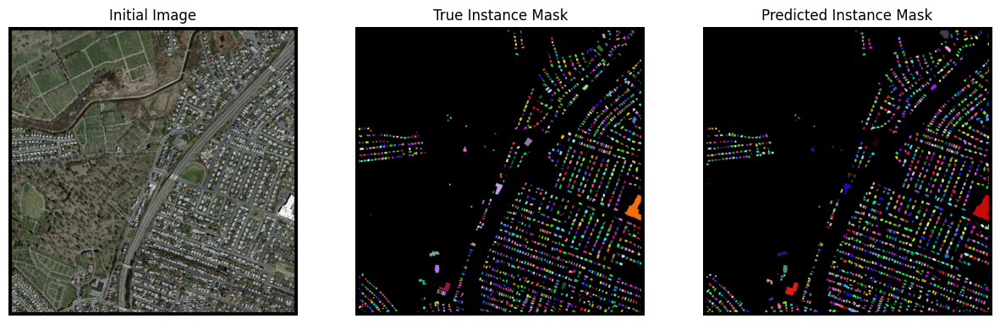

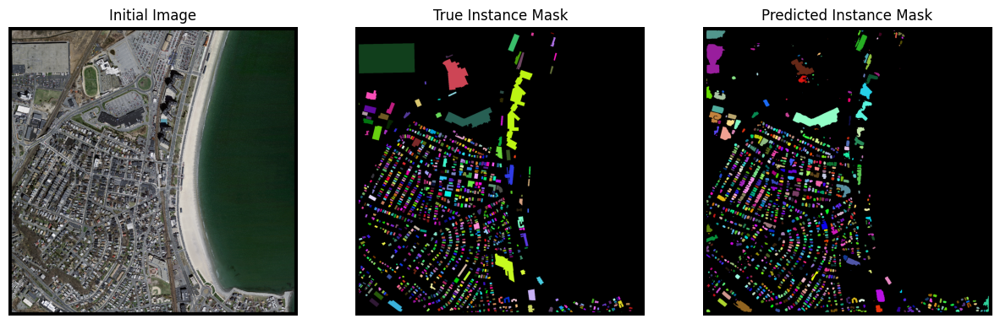

In [13]:
results = process_predictions_to_instance_masks(predictions)
visualize_instance_results(results)

In [14]:
metrics, results = evaluate_instance_masks(predictions, iou_threshold=0.5)

print("Overall Metrics:")
print(f"Total Target Buildings: {metrics['total_target_buildings']}")
print(f"Total Predicted Buildings: {metrics['total_predicted_buildings']}")
print(f"Total Successfully Identified Buildings: {metrics['total_successful_buildings']}")
print(f"Average IoU Per Building: {metrics['average_iou_per_building']:.4f}")
print(f"Overall Success Rate: {metrics['overall_success_rate']:.4%}")
print(f"Overall Error Rate: {metrics['overall_error_rate']:.4%}")


100%|██████████| 10/10 [02:00<00:00, 12.06s/it]

Overall Metrics:
Total Target Buildings: 15306
Total Predicted Buildings: 15770
Total Successfully Identified Buildings: 10907
Average IoU Per Building: 0.5992
Overall Success Rate: 71.2596%
Overall Error Rate: 30.8370%
